# Preprocessing CMIP6 data for ssp126

In [1]:
#imports
from matplotlib import pyplot as plt
from matplotlib.lines import Line2D 
from scipy import stats
import cftime
import numpy as np
import pandas as pd
import xarray as xr
import zarr
import gcsfs
import cartopy
import cartopy.crs as ccrs
import cartopy.feature as cfeature

In [2]:
df = pd.read_csv('https://storage.googleapis.com/cmip6/cmip6-zarr-consolidated-stores.csv')
df.head()

,activity_id,institution_id,source_id,experiment_id,member_id,table_id,variable_id,grid_label,zstore,dcpp_init_year,version
0,HighResMIP,CMCC,CMCC-CM2-HR4,highresSST-present,r1i1p1f1,Amon,ps,gn,gs://cmip6/CMIP6/HighResMIP/CMCC/CMCC-CM2-HR4/...,NaN,20170706
1,HighResMIP,CMCC,CMCC-CM2-HR4,highresSST-present,r1i1p1f1,Amon,rsds,gn,gs://cmip6/CMIP6/HighResMIP/CMCC/CMCC-CM2-HR4/...,NaN,20170706
2,HighResMIP,CMCC,CMCC-CM2-HR4,highresSST-present,r1i1p1f1,Amon,rlus,gn,gs://cmip6/CMIP6/HighResMIP/CMCC/CMCC-CM2-HR4/...,NaN,20170706
3,HighResMIP,CMCC,CMCC-CM2-HR4,highresSST-present,r1i1p1f1,Amon,rlds,gn,gs://cmip6/CMIP6/HighResMIP/CMCC/CMCC-CM2-HR4/...,NaN,20170706
4,HighResMIP,CMCC,CMCC-CM2-HR4,highresSST-present,r1i1p1f1,Amon,psl,gn,gs://cmip6/CMIP6/HighResMIP/CMCC/CMCC-CM2-HR4/...,NaN,20170706


In [3]:
gcs = gcsfs.GCSFileSystem(token='anon')

In [4]:
df_tas_hist=df.query  ("activity_id=='CMIP'         & table_id == 'Amon' & variable_id == 'tas' & experiment_id=='historical'& member_id=='r1i1p1f1'")
df_tas_ssp126=df.query("activity_id=='ScenarioMIP'  & table_id == 'Amon' & variable_id == 'tas' & experiment_id=='ssp126'    & member_id=='r1i1p1f1'")

#  assemble a set of models (source_id) for each experiment + variable combination
models_tas_hist  =set(df_tas_hist.source_id)    # all models that have temperature in the historical simulations
models_tas_ssp126=set(df_tas_ssp126.source_id)  # all models that have temperature in the ssp126     simulations

# let's only keep the models that have all the runs (the intersection of the set)
source_set = set.intersection(models_tas_hist, models_tas_ssp126)
source_list=list(source_set)
print(len(models_tas_hist))
print(len(models_tas_ssp126))
print(len(source_list))

55
33
33


In [5]:
source_list.remove('NorESM2-LM')
source_list.remove('MPI-ESM1-2-LR')
source_list.remove('AWI-CM-1-1-MR')
source_list.remove('NorESM2-MM')
source_list.remove('MPI-ESM1-2-HR')
source_list.remove('IPSL-CM5A2-INCA')
print(len(source_list))

27


In [6]:
source_list

['EC-Earth3-Veg',
 'FIO-ESM-2-0',
 'KIOST-ESM',
 'NESM3',
 'IPSL-CM6A-LR',
 'MRI-ESM2-0',
 'ACCESS-ESM1-5',
 'ACCESS-CM2',
 'INM-CM5-0',
 'EC-Earth3-Veg-LR',
 'CAS-ESM2-0',
 'CAMS-CSM1-0',
 'EC-Earth3',
 'MIROC6',
 'IITM-ESM',
 'GFDL-ESM4',
 'BCC-CSM2-MR',
 'CMCC-ESM2',
 'CESM2-WACCM',
 'CIESM',
 'FGOALS-g3',
 'FGOALS-f3-L',
 'CanESM5',
 'INM-CM4-8',
 'KACE-1-0-G',
 'TaiESM1',
 'CMCC-CM2-SR5']

In [7]:
def load_zarr_dset(df):
  # get the path to a specific zarr store (the first one from the dataframe above)
  zstore = df.zstore.values[-1]

  # create a mutable-mapping-style interface to the store
  mapper = gcs.get_mapper(zstore)

  # open it using xarray and zarr
  ds = xr.open_zarr(mapper, consolidated=True)
  return ds

In [8]:
#time index to assign model times to
new_time_index=pd.date_range('1850-01-01', '2099-12-31', freq='ME')
new_time_index

DatetimeIndex(['1850-01-31', '1850-02-28', '1850-03-31', '1850-04-30',
               '1850-05-31', '1850-06-30', '1850-07-31', '1850-08-31',
               '1850-09-30', '1850-10-31',
               ...
               '2099-03-31', '2099-04-30', '2099-05-31', '2099-06-30',
               '2099-07-31', '2099-08-31', '2099-09-30', '2099-10-31',
               '2099-11-30', '2099-12-31'],
              dtype='datetime64[ns]', length=3000, freq='ME')

In [9]:
#regrid to common 1x1 grid
new_lats=np.arange(-87,88)
new_lons=np.arange(1,359)

### 1.2 Load Multiple Models

In [10]:
gcm_list = ['CAS-ESM2-0',
 'BCC-CSM2-MR',
 'INM-CM4-8',
 'EC-Earth3-Veg',
 'CMCC-ESM2']

In [11]:
#adding in model name for coordinates instead of number
ds_list2 = list()
for source in gcm_list:
    df_hist_tas=df.query  ("activity_id=='CMIP'         & table_id == 'Amon' & variable_id == 'tas'"
                           "& experiment_id=='historical'& member_id=='r1i1p1f1' & source_id== @source")
    df_ssp126_tas=df.query("activity_id=='ScenarioMIP'  & table_id == 'Amon' & variable_id == 'tas'" 
                           "& experiment_id=='ssp126'    & member_id=='r1i1p1f1' & source_id== @source")
    ds_hist_tas   =load_zarr_dset(df_hist_tas)
    ds_ssp126_tas =load_zarr_dset(df_ssp126_tas)
    #concat data
    ds_all = xr.concat([ds_hist_tas, ds_ssp126_tas], dim = ('time'), coords='all', compat = 'override')
    #global mean w weights
    weights = np.cos(np.deg2rad(ds_all.tas.lat))
    ds_all = ds_all.weighted(weights).mean(dim=('lon', 'lat'))
    #slice to specific period and reassign new time index
    ds_all = ds_all.isel(time=slice(0,3000))
    ds_all = ds_all.assign(time=new_time_index)
    ds_all = ds_all.assign_coords(model=source) #creates model coordinate for the source
    #add to list
    ds_list2.append(ds_all)
ob_all2 = xr.concat(ds_list2, dim = 'model', coords = 'minimal',compat='override')
ob_all2

<xarray.Dataset>
Dimensions:  (time: 3000, model: 5)
Coordinates:
    height   (time) float64 2.0 2.0 2.0 2.0 2.0 2.0 ... 2.0 2.0 2.0 2.0 2.0 2.0
  * time     (time) datetime64[ns] 1850-01-31 1850-02-28 ... 2099-12-31
  * model    (model) <U13 'CAS-ESM2-0' 'BCC-CSM2-MR' ... 'CMCC-ESM2'
Data variables:
    tas      (model, time) float64 dask.array<chunksize=(1, 126), meta=np.ndarray>

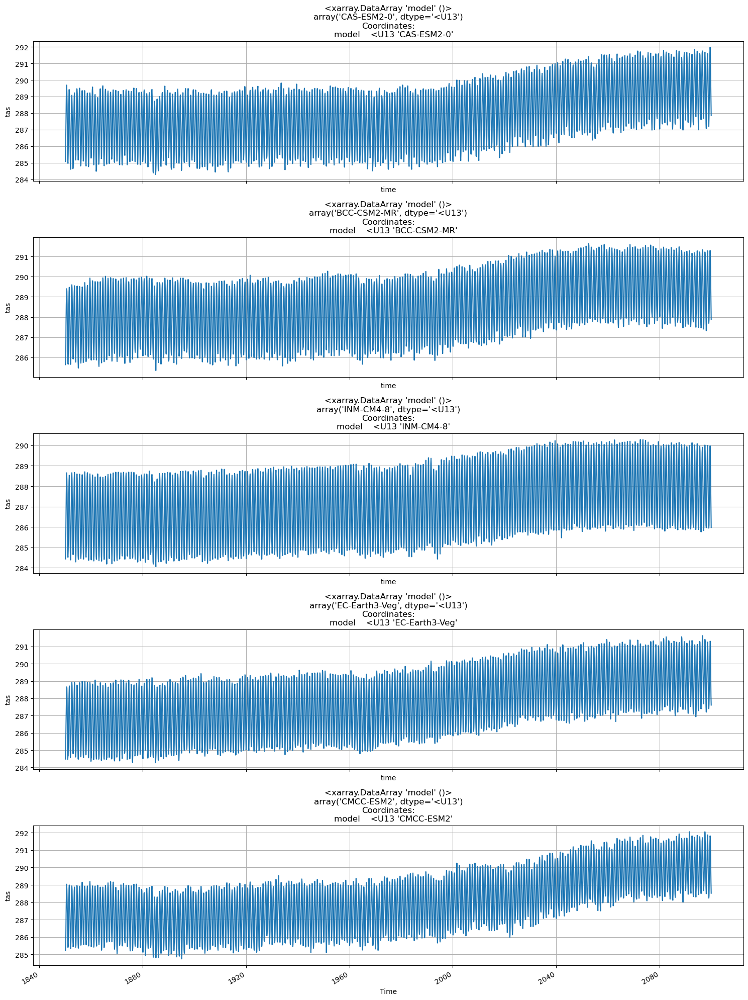

In [12]:
fig, axs = plt.subplots(5, 1, figsize=(15, 20), sharex=True)
for i, model in enumerate(ob_all2.model): #enumerate returns iterator of pairs, each pair contains the index and the corresponding element from the iterable
    ob_all2.sel(model=model).tas.plot(ax=axs[i], label=model) #selects each model and the tas variable, plots over each axes
    axs[i].set_title(model) #shows what model number
    axs[i].set_ylabel('tas')
    axs[i].grid(True) #makes gridlines on plot
axs[-1].set_xlabel('Time') 
plt.tight_layout() #creates a better layout for subplots
plt.show()

### Expand Analysis to All Models

In [13]:
ds_list_all = list()
for source in source_list:
    df_hist_tas=df.query  ("activity_id=='CMIP'         & table_id == 'Amon' & variable_id == 'tas'" 
                           "& experiment_id=='historical'& member_id=='r1i1p1f1' & source_id== @source")
    df_ssp126_tas=df.query("activity_id=='ScenarioMIP'  & table_id == 'Amon' & variable_id == 'tas'" 
                           "& experiment_id=='ssp126'    & member_id=='r1i1p1f1' & source_id== @source")
    #load in data into dataset
    ds_hist_tas   =load_zarr_dset(df_hist_tas)
    ds_ssp126_tas =load_zarr_dset(df_ssp126_tas)
    #concat data
    ds_all = xr.concat([ds_hist_tas, ds_ssp126_tas], dim = ('time'), coords='all', compat = 'override')
    #global mean w weights
    weights = np.cos(np.deg2rad(ds_all.tas.lat))
    ds_all = ds_all.weighted(weights).mean(dim=('lon', 'lat'))
    #slice to specific period and reassign new time index
    ds_all = ds_all.isel(time=slice(0,3000))
    ds_all = ds_all.assign(time=new_time_index)
    ds_all = ds_all.assign_coords(model=source) #creates model coordinate for the source
    ds_all.coords
    #add to list
    ds_list_all.append(ds_all)

ds_all_models = xr.concat(ds_list_all, dim = 'model', coords = 'minimal',compat='override')
ds_all_models

C:\Users\panda\miniconda3\envs\temp_var\Lib\site-packages\xarray\coding\times.py:724: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
C:\Users\panda\miniconda3\envs\temp_var\Lib\site-packages\xarray\coding\times.py:724: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
C:\Users\panda\miniconda3\envs\temp_var\Lib\site-packages\xarray\core\indexing.py:557: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  array = array.get_duck_array()
C:\Users\panda\miniconda3\envs\temp_var\Lib\site-packages\xarray\codin

<xarray.Dataset>
Dimensions:  (time: 3000, model: 27)
Coordinates:
    height   (time) float64 2.0 2.0 2.0 2.0 2.0 2.0 ... 2.0 2.0 2.0 2.0 2.0 2.0
  * time     (time) datetime64[ns] 1850-01-31 1850-02-28 ... 2099-12-31
  * model    (model) <U16 'EC-Earth3-Veg' 'FIO-ESM-2-0' ... 'CMCC-CM2-SR5'
Data variables:
    tas      (model, time) float64 dask.array<chunksize=(1, 126), meta=np.ndarray>

In [14]:
#drop height coordinate
ds_all_models = ds_all_models.drop_vars('height')
ds_all_models

<xarray.Dataset>
Dimensions:  (time: 3000, model: 27)
Coordinates:
  * time     (time) datetime64[ns] 1850-01-31 1850-02-28 ... 2099-12-31
  * model    (model) <U16 'EC-Earth3-Veg' 'FIO-ESM-2-0' ... 'CMCC-CM2-SR5'
Data variables:
    tas      (model, time) float64 dask.array<chunksize=(1, 126), meta=np.ndarray>

#### Adding More Models

In [15]:
#make a separate list to concat with ds_all_models 
ds_list2 = list()
#query to individual model
df_hist_tas = df.query(  "source_id == 'UKESM1-0-LL' & member_id == 'r1i1p1f2'" 
                       "& activity_id=='CMIP'        & table_id == 'Amon' & variable_id == 'tas' & experiment_id=='historical'")
df_ssp126_tas = df.query("source_id == 'UKESM1-0-LL' & member_id == 'r1i1p1f2'" 
                         "& activity_id=='ScenarioMIP' & table_id == 'Amon' & variable_id == 'tas' & experiment_id=='ssp126'")
#load model as dataset
ds_hist_tas   =load_zarr_dset(df_hist_tas)
ds_ssp126_tas =load_zarr_dset(df_ssp126_tas)
ds_all = xr.concat([ds_hist_tas, ds_ssp126_tas], dim = ('time'), coords='all', compat = 'override')
#global mean w weights
weights = np.cos(np.deg2rad(ds_all.tas.lat))
ds_all = ds_all.weighted(weights).mean(dim=('lon', 'lat'))
#slice to specific period and reassign new time index
ds_all = ds_all.isel(time=slice(0,3000))
ds_all = ds_all.assign(time=new_time_index)
ds_all = ds_all.assign_coords(model=ds_hist_tas.source_id) #creates model coordinate for the source
#remove height coord
ds_all = ds_all.drop_vars('height')
#check all dimensions for consistency
print(ds_all.coords)
#add to list w other ensemble of models
ds_list2.append(ds_all)

Coordinates:
  * time     (time) datetime64[ns] 1850-01-31 1850-02-28 ... 2099-12-31
    model    <U11 'UKESM1-0-LL'


In [16]:
#query to individual model
df_hist_tas = df.query(  "source_id == 'GISS-E2-1-H' & member_id == 'r1i1p1f2'" 
                       "& activity_id=='CMIP'        & table_id == 'Amon' & variable_id == 'tas' & experiment_id=='historical'")
df_ssp126_tas = df.query("source_id == 'GISS-E2-1-H' & member_id == 'r1i1p1f2'" 
                         "& activity_id=='ScenarioMIP' & table_id == 'Amon' & variable_id == 'tas' & experiment_id=='ssp126'")
#load model as dataset
ds_hist_tas   =load_zarr_dset(df_hist_tas)
ds_ssp126_tas =load_zarr_dset(df_ssp126_tas)
ds_all = xr.concat([ds_hist_tas, ds_ssp126_tas], dim = ('time'), coords='all', compat = 'override')
#global mean w weights
weights = np.cos(np.deg2rad(ds_all.tas.lat))
ds_all = ds_all.weighted(weights).mean(dim=('lon', 'lat'))
#slice to specific period and reassign new time index
ds_all = ds_all.isel(time=slice(0,3000))
ds_all = ds_all.assign(time=new_time_index)
ds_all = ds_all.assign_coords(model=ds_hist_tas.source_id) #creates model coordinate for the source
#remove height coord
ds_all = ds_all.drop_vars('height')
#check all dimensions for consistency
print(ds_all.coords)
#add to list w other ensemble of models
ds_list2.append(ds_all)

Coordinates:
  * time     (time) datetime64[ns] 1850-01-31 1850-02-28 ... 2099-12-31
    model    <U11 'GISS-E2-1-H'


In [17]:
#query to individual model
df_hist_tas = df.query(  "source_id == 'CNRM-CM6-1-HR' & member_id == 'r1i1p1f2'" 
                       "& activity_id=='CMIP'        & table_id == 'Amon' & variable_id == 'tas' & experiment_id=='historical'")
df_ssp126_tas = df.query("source_id == 'CNRM-CM6-1-HR' & member_id == 'r1i1p1f2'" 
                         "& activity_id=='ScenarioMIP' & table_id == 'Amon' & variable_id == 'tas' & experiment_id=='ssp126'")
#load model as dataset
ds_hist_tas   =load_zarr_dset(df_hist_tas)
ds_ssp126_tas =load_zarr_dset(df_ssp126_tas)
ds_all = xr.concat([ds_hist_tas, ds_ssp126_tas], dim = ('time'), coords='all', compat = 'override')
#global mean w weights
weights = np.cos(np.deg2rad(ds_all.tas.lat))
ds_all = ds_all.weighted(weights).mean(dim=('lon', 'lat'))
#slice to specific period and reassign new time index
ds_all = ds_all.isel(time=slice(0,3000))
ds_all = ds_all.assign(time=new_time_index)
ds_all = ds_all.assign_coords(model=ds_hist_tas.source_id) #creates model coordinate for the source
#remove height coord
ds_all = ds_all.drop_vars('height')
#check all dimensions for consistency
print(ds_all.coords)
#add to list w other ensemble of models
ds_list2.append(ds_all)

Coordinates:
  * time     (time) datetime64[ns] 1850-01-31 1850-02-28 ... 2099-12-31
    model    <U13 'CNRM-CM6-1-HR'


In [18]:
#query to individual model
df_hist_tas = df.query(  "source_id == 'CNRM-CM6-1' & member_id == 'r1i1p1f2'" 
                       "& activity_id=='CMIP'        & table_id == 'Amon' & variable_id == 'tas' & experiment_id=='historical'")
df_ssp126_tas = df.query("source_id == 'CNRM-CM6-1' & member_id == 'r1i1p1f2'" 
                         "& activity_id=='ScenarioMIP' & table_id == 'Amon' & variable_id == 'tas' & experiment_id=='ssp126'")
#load model as dataset
ds_hist_tas   =load_zarr_dset(df_hist_tas)
ds_ssp126_tas =load_zarr_dset(df_ssp126_tas)
ds_all = xr.concat([ds_hist_tas, ds_ssp126_tas], dim = ('time'), coords='all', compat = 'override')
#global mean w weights
weights = np.cos(np.deg2rad(ds_all.tas.lat))
ds_all = ds_all.weighted(weights).mean(dim=('lon', 'lat'))
#slice to specific period and reassign new time index
ds_all = ds_all.isel(time=slice(0,3000))
ds_all = ds_all.assign(time=new_time_index)
ds_all = ds_all.assign_coords(model=ds_hist_tas.source_id) #creates model coordinate for the source
#remove height coord
ds_all = ds_all.drop_vars('height')
#check all dimensions for consistency
print(ds_all.coords)
#add to list w other ensemble of models
ds_list2.append(ds_all)

Coordinates:
  * time     (time) datetime64[ns] 1850-01-31 1850-02-28 ... 2099-12-31
    model    <U10 'CNRM-CM6-1'


In [41]:
#query to individual model
df_hist_tas = df.query(  "source_id == 'GISS-E2-1-G' & member_id == 'r2i1p1f2'" 
                       "& activity_id=='CMIP'        & table_id == 'Amon' & variable_id == 'tas' & experiment_id=='historical'")
df_ssp126_tas = df.query("source_id == 'GISS-E2-1-G' & member_id == 'r2i1p1f2'" 
                         "& activity_id=='ScenarioMIP' & table_id == 'Amon' & variable_id == 'tas' & experiment_id=='ssp126'")
#load model as dataset
ds_hist_tas   =load_zarr_dset(df_hist_tas)
ds_ssp126_tas =load_zarr_dset(df_ssp126_tas)
ds_all = xr.concat([ds_hist_tas, ds_ssp126_tas], dim = ('time'), coords='all', compat = 'override')
#global mean w weights
weights = np.cos(np.deg2rad(ds_all.tas.lat))
ds_all = ds_all.weighted(weights).mean(dim=('lon', 'lat'))
#slice to specific period and reassign new time index
ds_all = ds_all.isel(time=slice(0,3000))
ds_all = ds_all.assign(time=new_time_index)
ds_all = ds_all.assign_coords(model=ds_hist_tas.source_id) #creates model coordinate for the source
#remove height coord
ds_all = ds_all.drop_vars('height')
#check all dimensions for consistency
print(ds_all.coords)
#add to list w other ensemble of models
ds_list2.append(ds_all)

Coordinates:
  * time     (time) datetime64[ns] 1850-01-31 1850-02-28 ... 2099-12-31
    model    <U11 'GISS-E2-1-G'


In [42]:
#query to individual model
df_hist_tas = df.query(  "source_id == 'CESM2' & member_id == 'r4i1p1f1' & activity_id=='CMIP'        & table_id == 'Amon' & variable_id == 'tas' & experiment_id=='historical'")
df_ssp126_tas = df.query("source_id == 'CESM2' & member_id == 'r4i1p1f1' & activity_id=='ScenarioMIP' & table_id == 'Amon' & variable_id == 'tas' & experiment_id=='ssp126'")
#load model as dataset
ds_hist_tas   =load_zarr_dset(df_hist_tas)
ds_ssp126_tas =load_zarr_dset(df_ssp126_tas)
ds_all = xr.concat([ds_hist_tas, ds_ssp126_tas], dim = ('time'), coords='all', compat = 'override')
#global mean w weights
weights = np.cos(np.deg2rad(ds_all.tas.lat))
ds_all = ds_all.weighted(weights).mean(dim=('lon', 'lat'))
#slice to specific period and reassign new time index
ds_all = ds_all.isel(time=slice(0,3000))
ds_all = ds_all.assign(time=new_time_index)
ds_all = ds_all.assign_coords(model=ds_hist_tas.source_id) #creates model coordinate for the source
#check all dimensions for consistency
print(ds_all.coords)
#add to list w other ensemble of models
ds_12_models_list.append(ds_all)
#concat to ds_all_models

Coordinates:
  * time     (time) datetime64[ns] 1850-01-31 1850-02-28 ... 2099-12-31
    model    <U5 'CESM2'


In [43]:
#query to individual model
df_hist_tas = df.query(  "source_id == 'CanESM5-CanOE' & member_id == 'r1i1p2f1' & activity_id=='CMIP'        & table_id == 'Amon' & variable_id == 'tas' & experiment_id=='historical'")
df_ssp126_tas = df.query("source_id == 'CanESM5-CanOE' & member_id == 'r1i1p2f1' & activity_id=='ScenarioMIP' & table_id == 'Amon' & variable_id == 'tas' & experiment_id=='ssp126'")
#load model as dataset
ds_hist_tas   =load_zarr_dset(df_hist_tas)
ds_ssp126_tas =load_zarr_dset(df_ssp126_tas)
ds_all = xr.concat([ds_hist_tas, ds_ssp126_tas], dim = ('time'), coords='all', compat = 'override')
#global mean w weights
weights = np.cos(np.deg2rad(ds_all.tas.lat))
ds_all = ds_all.weighted(weights).mean(dim=('lon', 'lat'))
#slice to specific period and reassign new time index
ds_all = ds_all.isel(time=slice(0,3000))
ds_all = ds_all.assign(time=new_time_index)
ds_all = ds_all.assign_coords(model=ds_hist_tas.source_id) #creates model coordinate for the source
#remove height coord
ds_all = ds_all.drop_vars('height')
#check all dimensions for consistency
print(ds_all.coords)
#add to list w other ensemble of models
ds_12_models_list.append(ds_all)
#concat to ds_all_models

Coordinates:
  * time     (time) datetime64[ns] 1850-01-31 1850-02-28 ... 2099-12-31
    model    <U13 'CanESM5-CanOE'


In [44]:
#query to individual model
df_hist_tas = df.query(  "source_id == 'MCM-UA-1-0' & member_id == 'r1i1p1f2' & activity_id=='CMIP'        & table_id == 'Amon' & variable_id == 'tas' & experiment_id=='historical'")
df_ssp126_tas = df.query("source_id == 'MCM-UA-1-0' & member_id == 'r1i1p1f2' & activity_id=='ScenarioMIP' & table_id == 'Amon' & variable_id == 'tas' & experiment_id=='ssp126'")
#load model as dataset
ds_hist_tas   =load_zarr_dset(df_hist_tas)
ds_ssp126_tas =load_zarr_dset(df_ssp126_tas)
ds_all = xr.concat([ds_hist_tas, ds_ssp126_tas], dim = ('time'), coords='all', compat = 'override')
#rename latitude and longitude to lat/lon for consistency
ds_all = ds_all.rename({'latitude': 'lat', 'longitude': 'lon'})
#global mean w weights
weights = np.cos(np.deg2rad(ds_all.tas.lat))
ds_all = ds_all.weighted(weights).mean(dim=('lon', 'lat'))
#slice to specific period and reassign new time index
ds_all = ds_all.isel(time=slice(0,3000))
ds_all = ds_all.assign(time=new_time_index)
ds_all = ds_all.assign_coords(model=ds_hist_tas.source_id) #creates model coordinate for the source
#remove height coord
ds_all = ds_all.drop_vars('height')
#check all dimensions for consistency
print(ds_all.coords)
#add to list w other ensemble of models
ds_12_models_list.append(ds_all)
#concat to ds_all_models

Coordinates:
  * time     (time) datetime64[ns] 1850-01-31 1850-02-28 ... 2099-12-31
    model    <U10 'MCM-UA-1-0'


In [45]:
#query to individual model
df_hist_tas = df.query(  "source_id == 'HadGEM3-GC31-MM' & member_id == 'r1i1p1f3' & activity_id=='CMIP'        & table_id == 'Amon' & variable_id == 'tas' & experiment_id=='historical'")
df_ssp126_tas = df.query("source_id == 'HadGEM3-GC31-MM' & member_id == 'r1i1p1f3' & activity_id=='ScenarioMIP' & table_id == 'Amon' & variable_id == 'tas' & experiment_id=='ssp126'")
#load model as dataset
ds_hist_tas   =load_zarr_dset(df_hist_tas)
ds_ssp126_tas =load_zarr_dset(df_ssp126_tas)
ds_all = xr.concat([ds_hist_tas, ds_ssp126_tas], dim = ('time'), coords='all', compat = 'override')
#global mean w weights
weights = np.cos(np.deg2rad(ds_all.tas.lat))
ds_all = ds_all.weighted(weights).mean(dim=('lon', 'lat'))
#slice to specific period and reassign new time index
ds_all = ds_all.isel(time=slice(0,3000))
ds_all = ds_all.assign(time=new_time_index)
ds_all = ds_all.assign_coords(model=ds_hist_tas.source_id) #creates model coordinate for the source
#remove height coord
ds_all = ds_all.drop_vars('height')
#check all dimensions for consistency
print(ds_all.coords)
#add to list w other ensemble of models
ds_12_models_list.append(ds_all)
#concat to ds_all_models

Coordinates:
  * time     (time) datetime64[ns] 1850-01-31 1850-02-28 ... 2099-12-31
    model    <U15 'HadGEM3-GC31-MM'


In [46]:
#query to individual model
df_hist_tas = df.query(  "source_id == 'HadGEM3-GC31-LL' & member_id == 'r1i1p1f3' & activity_id=='CMIP'        & table_id == 'Amon' & variable_id == 'tas' & experiment_id=='historical'")
df_ssp126_tas = df.query("source_id == 'HadGEM3-GC31-LL' & member_id == 'r1i1p1f3' & activity_id=='ScenarioMIP' & table_id == 'Amon' & variable_id == 'tas' & experiment_id=='ssp126'")
#load model as dataset
ds_hist_tas   =load_zarr_dset(df_hist_tas)
ds_ssp126_tas =load_zarr_dset(df_ssp126_tas)
ds_all = xr.concat([ds_hist_tas, ds_ssp126_tas], dim = ('time'), coords='all', compat = 'override')
#global mean w weights
weights = np.cos(np.deg2rad(ds_all.tas.lat))
ds_all = ds_all.weighted(weights).mean(dim=('lon', 'lat'))
#slice to specific period and reassign new time index
ds_all = ds_all.isel(time=slice(0,3000))
ds_all = ds_all.assign(time=new_time_index)
ds_all = ds_all.assign_coords(model=ds_hist_tas.source_id) #creates model coordinate for the source
#remove height coord
ds_all = ds_all.drop_vars('height')
#check all dimensions for consistency
print(ds_all.coords)
#add to list w other ensemble of models
ds_12_models_list.append(ds_all)
#concat to ds_all_models

Coordinates:
  * time     (time) datetime64[ns] 1850-01-31 1850-02-28 ... 2099-12-31
    model    <U15 'HadGEM3-GC31-LL'


In [47]:
#query to individual model
df_hist_tas = df.query(  "source_id == 'MIROC-ES2L' & member_id == 'r1i1p1f2' & activity_id=='CMIP'        & table_id == 'Amon' & variable_id == 'tas' & experiment_id=='historical'")
df_ssp126_tas = df.query("source_id == 'MIROC-ES2L' & member_id == 'r1i1p1f2' & activity_id=='ScenarioMIP' & table_id == 'Amon' & variable_id == 'tas' & experiment_id=='ssp126'")
#load model as dataset
ds_hist_tas   =load_zarr_dset(df_hist_tas)
ds_ssp126_tas =load_zarr_dset(df_ssp126_tas)
ds_all = xr.concat([ds_hist_tas, ds_ssp126_tas], dim = ('time'), coords='all', compat = 'override')
#global mean w weights
weights = np.cos(np.deg2rad(ds_all.tas.lat))
ds_all = ds_all.weighted(weights).mean(dim=('lon', 'lat'))
#slice to specific period and reassign new time index
ds_all = ds_all.isel(time=slice(0,3000))
ds_all = ds_all.assign(time=new_time_index)
ds_all = ds_all.assign_coords(model=ds_hist_tas.source_id) #creates model coordinate for the source
#remove height coord
ds_all = ds_all.drop_vars('height')
#check all dimensions for consistency
print(ds_all.coords)
#add to list w other ensemble of models
ds_12_models_list.append(ds_all)
#concat to ds_all_models

Coordinates:
  * time     (time) datetime64[ns] 1850-01-31 1850-02-28 ... 2099-12-31
    model    <U10 'MIROC-ES2L'


In [48]:
#query to individual model
df_hist_tas = df.query(  "source_id == 'CNRM-ESM2-1' & member_id == 'r1i1p1f2' & activity_id=='CMIP'        & table_id == 'Amon' & variable_id == 'tas' & experiment_id=='historical'")
df_ssp126_tas = df.query("source_id == 'CNRM-ESM2-1' & member_id == 'r1i1p1f2' & activity_id=='ScenarioMIP' & table_id == 'Amon' & variable_id == 'tas' & experiment_id=='ssp126'")
#load model as dataset
ds_hist_tas   =load_zarr_dset(df_hist_tas)
ds_ssp126_tas =load_zarr_dset(df_ssp126_tas)
ds_all = xr.concat([ds_hist_tas, ds_ssp126_tas], dim = ('time'), coords='all', compat = 'override')
#global mean w weights
weights = np.cos(np.deg2rad(ds_all.tas.lat))
ds_all = ds_all.weighted(weights).mean(dim=('lon', 'lat'))
#slice to specific period and reassign new time index
ds_all = ds_all.isel(time=slice(0,3000))
ds_all = ds_all.assign(time=new_time_index)
ds_all = ds_all.assign_coords(model=ds_hist_tas.source_id) #creates model coordinate for the source
#remove height coord
ds_all = ds_all.drop_vars('height')
#check all dimensions for consistency
print(ds_all.coords)
#add to list w other ensemble of models
ds_12_models_list.append(ds_all)
#concat to ds_all_models

Coordinates:
  * time     (time) datetime64[ns] 1850-01-31 1850-02-28 ... 2099-12-31
    model    <U11 'CNRM-ESM2-1'


In [49]:
ds_12_models = xr.concat(ds_12_models_list, dim = 'model', coords = 'minimal',compat='override')
ds_12_models = ds_12_models.drop_vars('areacella')
ds_12_models

<xarray.Dataset>
Dimensions:  (time: 3000, model: 12)
Coordinates:
  * time     (time) datetime64[ns] 1850-01-31 1850-02-28 ... 2099-12-31
  * model    (model) <U15 'UKESM1-0-LL' 'GISS-E2-1-H' ... 'CNRM-ESM2-1'
Data variables:
    tas      (model, time) float64 dask.array<chunksize=(1, 96), meta=np.ndarray>

In [50]:
ds_all_39 = xr.concat([ds_12_models, ds_all_models], dim = 'model', coords = 'minimal', compat = 'override')
ds_all_39

<xarray.Dataset>
Dimensions:  (time: 3000, model: 39)
Coordinates:
  * time     (time) datetime64[ns] 1850-01-31 1850-02-28 ... 2099-12-31
  * model    (model) <U16 'UKESM1-0-LL' 'GISS-E2-1-H' ... 'INM-CM4-8'
Data variables:
    tas      (model, time) float64 dask.array<chunksize=(1, 96), meta=np.ndarray>

### Plot Figures

In [74]:
#general fn for makes these subplots
def plot_time_series(fig_counter_input, num_subplots, model_index, dataset):
    fig, axs = plt.subplots(num_subplots, 1, figsize=(15, 20), sharex=True)
    fig_counter = fig_counter_input
    while fig_counter < (fig_counter_input + num_subplots): #made another while loop to separate the graphs and make it cleaner
        for i, model in enumerate(dataset.model[model_index:]): #sliced from 30th index after last model figure shown in previous cell block (index should be same each time in dataset)
            if fig_counter >= (fig_counter_input + num_subplots):
                break
            dataset.sel(model=model).tas.plot(ax=axs[i],label=model)
            axs[i].set_title(model) #shows what model number
            axs[i].set_ylabel('tas')
            axs[i].grid(True) #makes gridlines on plot
            fig_counter +=1
    axs[-1].set_xlabel('Time') 
    plt.tight_layout() #creates a better layout for subplots
    plt.show()

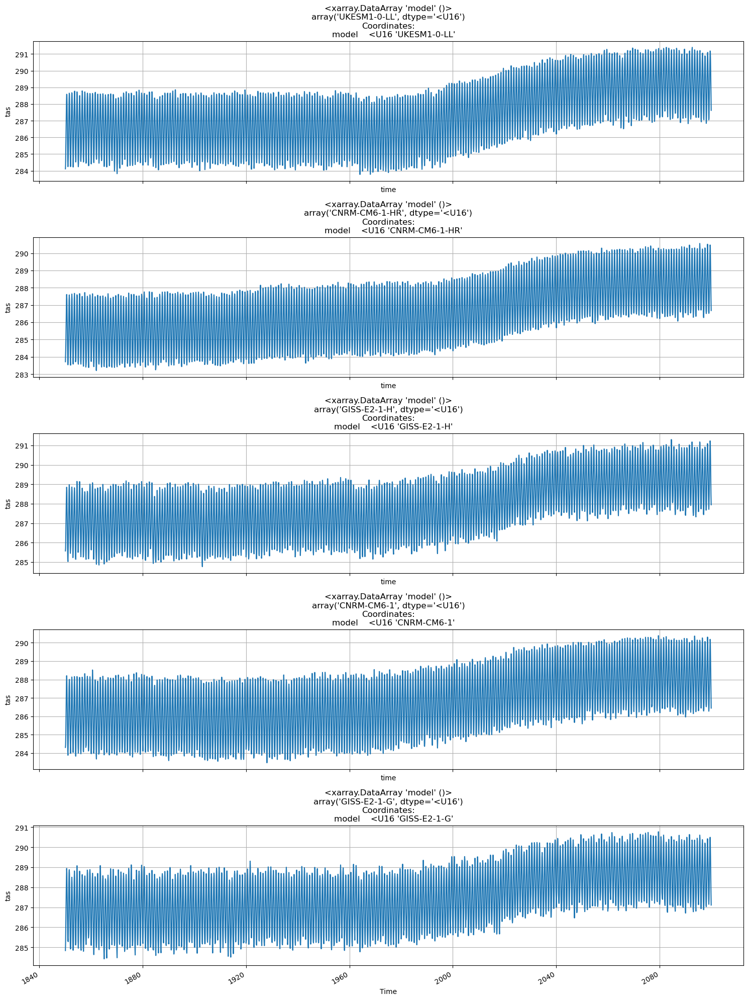

In [38]:
plot_time_series(0,5,0,ds_all_40)

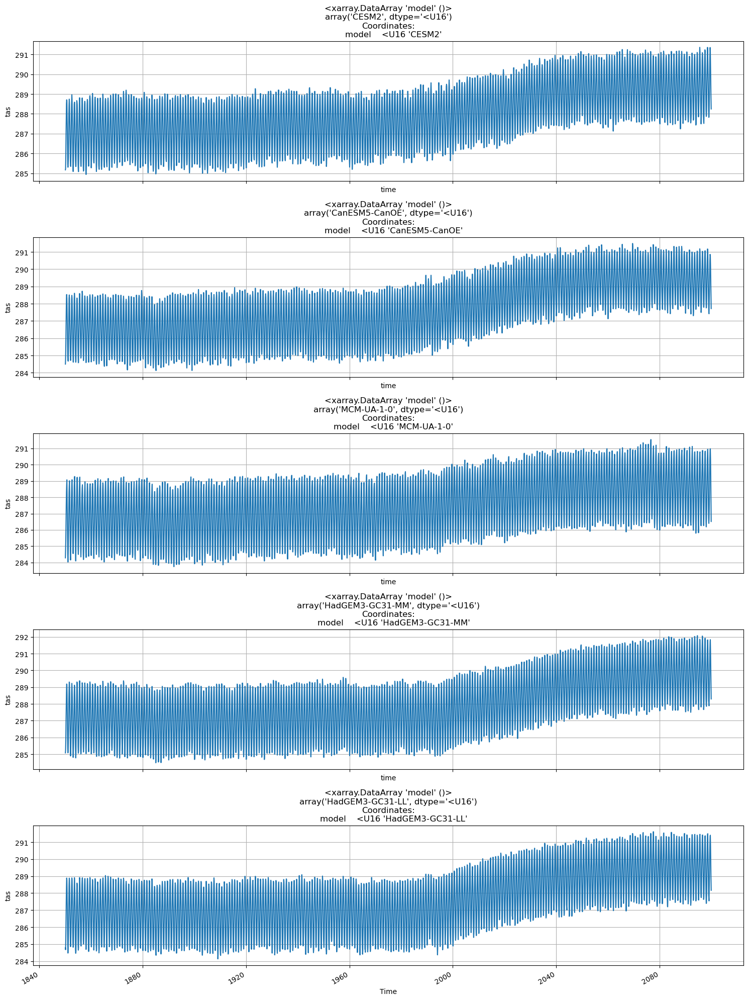

In [39]:
plot_time_series(0,5,5,ds_all_40)

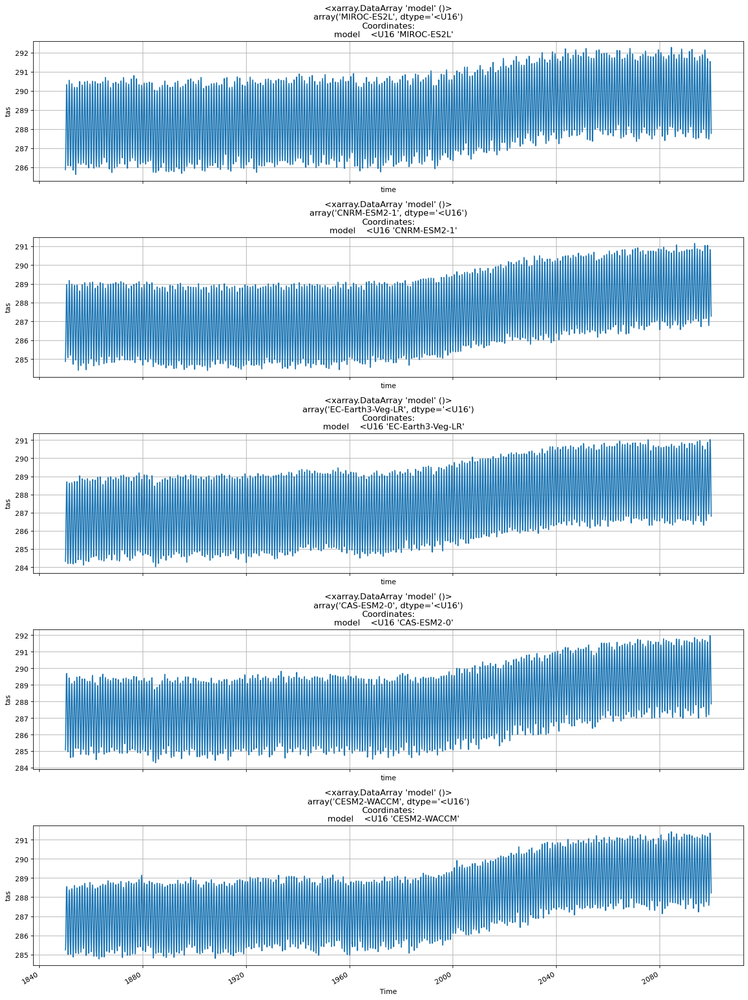

In [40]:
plot_time_series(0,5,10,ds_all_40)

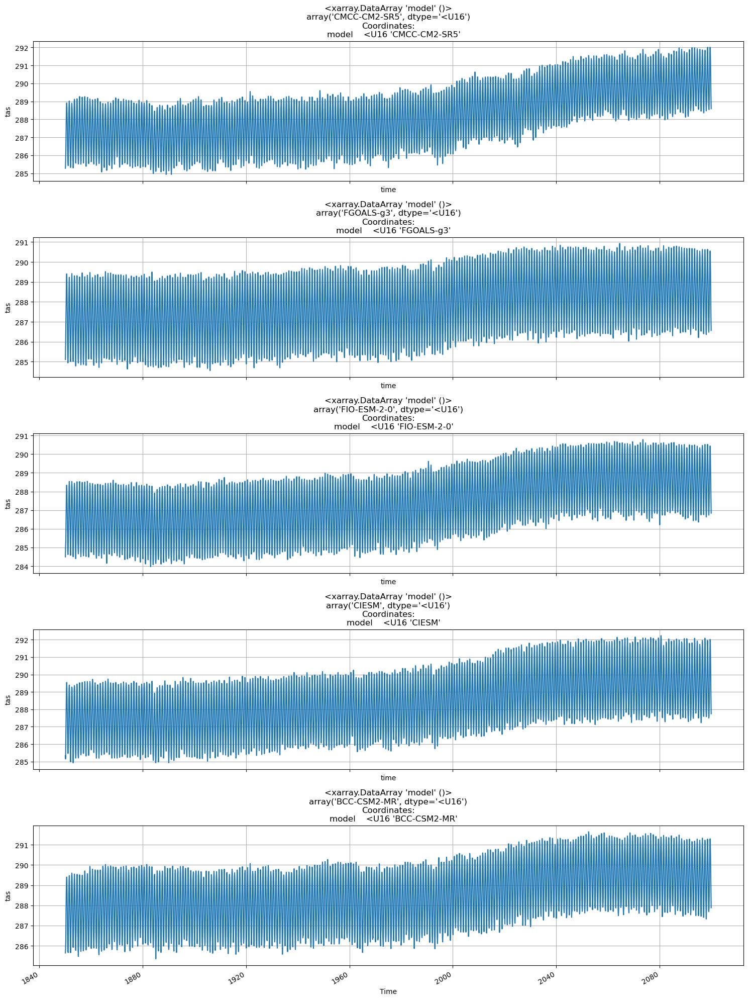

In [41]:
plot_time_series(0,5,15,ds_all_40)

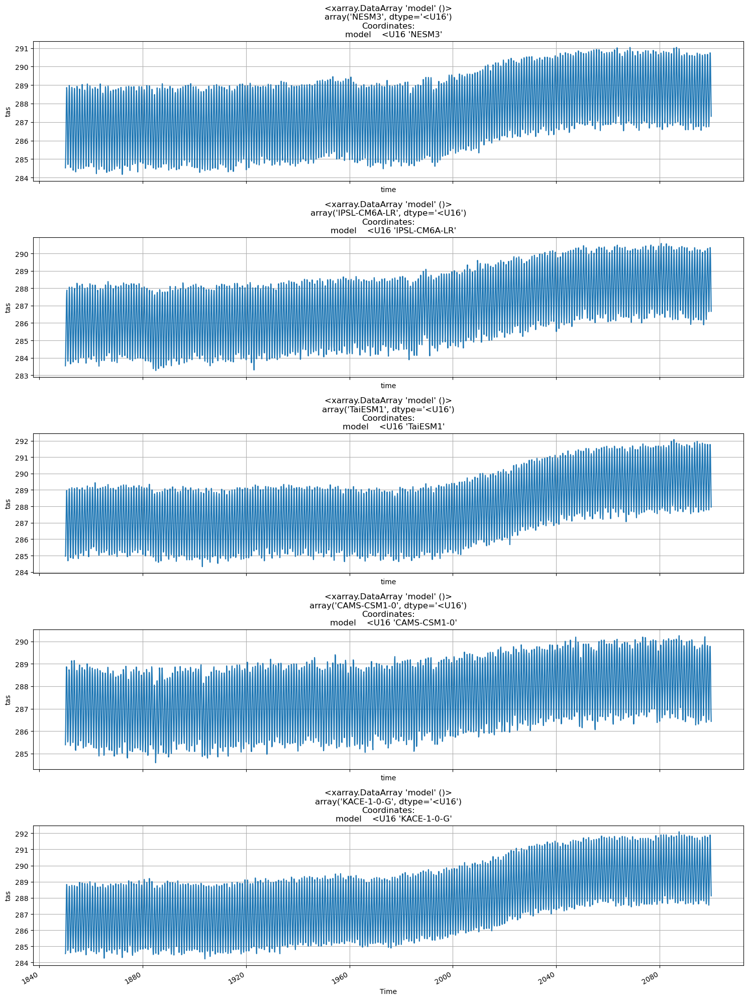

In [42]:
plot_time_series(0,5,20,ds_all_40)

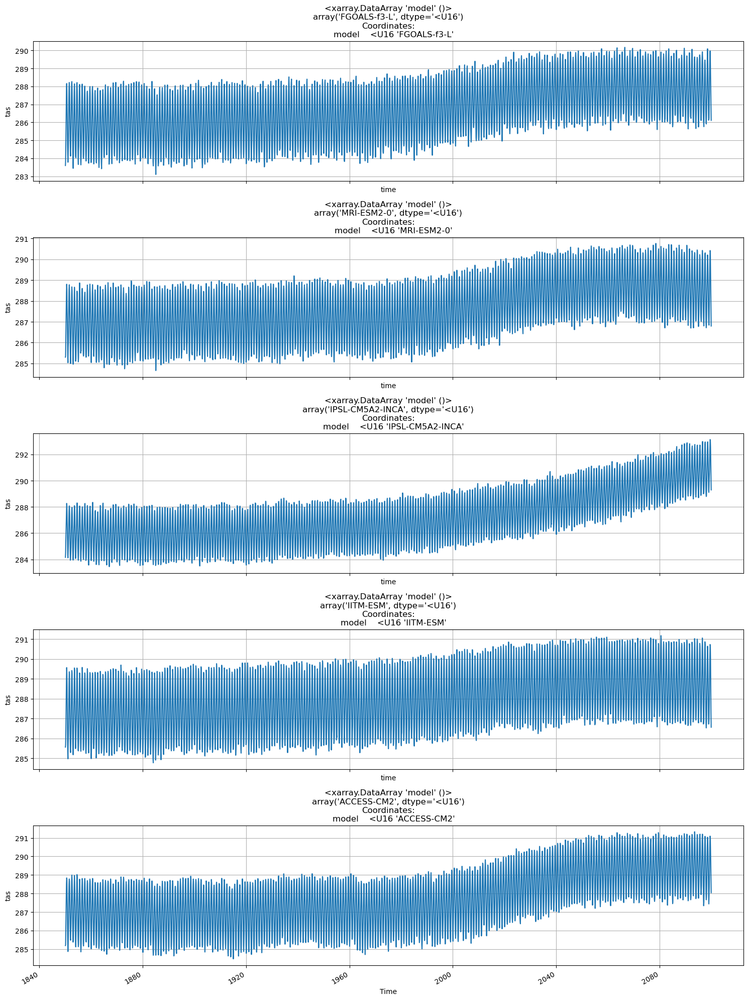

In [43]:
plot_time_series(0,5,25,ds_all_40)

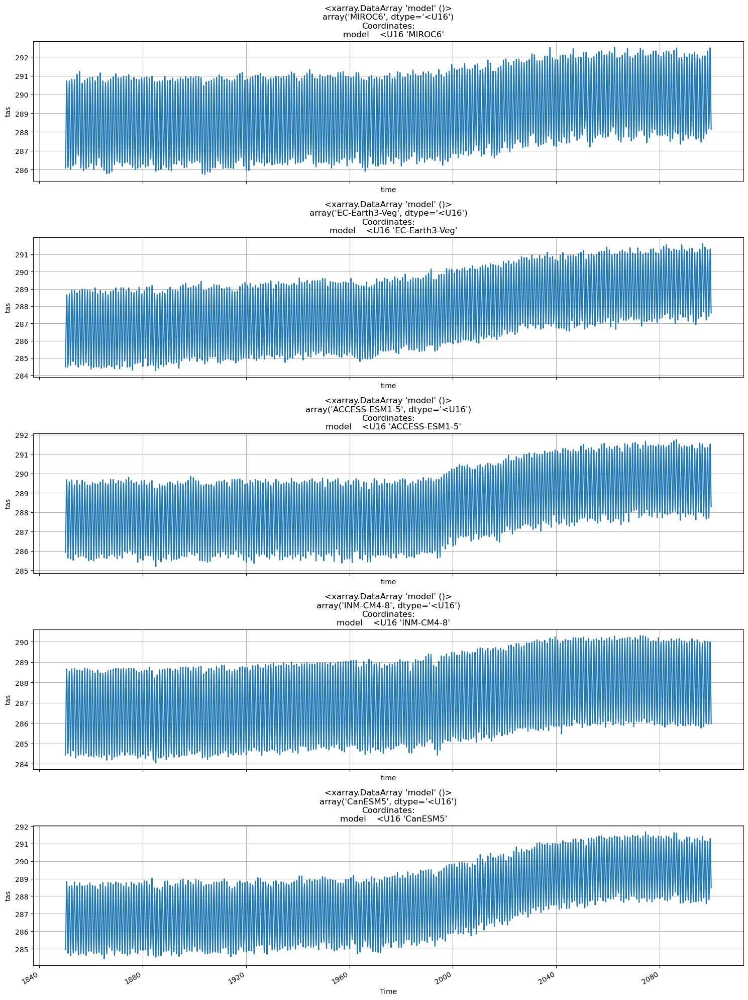

In [44]:
plot_time_series(0,5,30,ds_all_40)

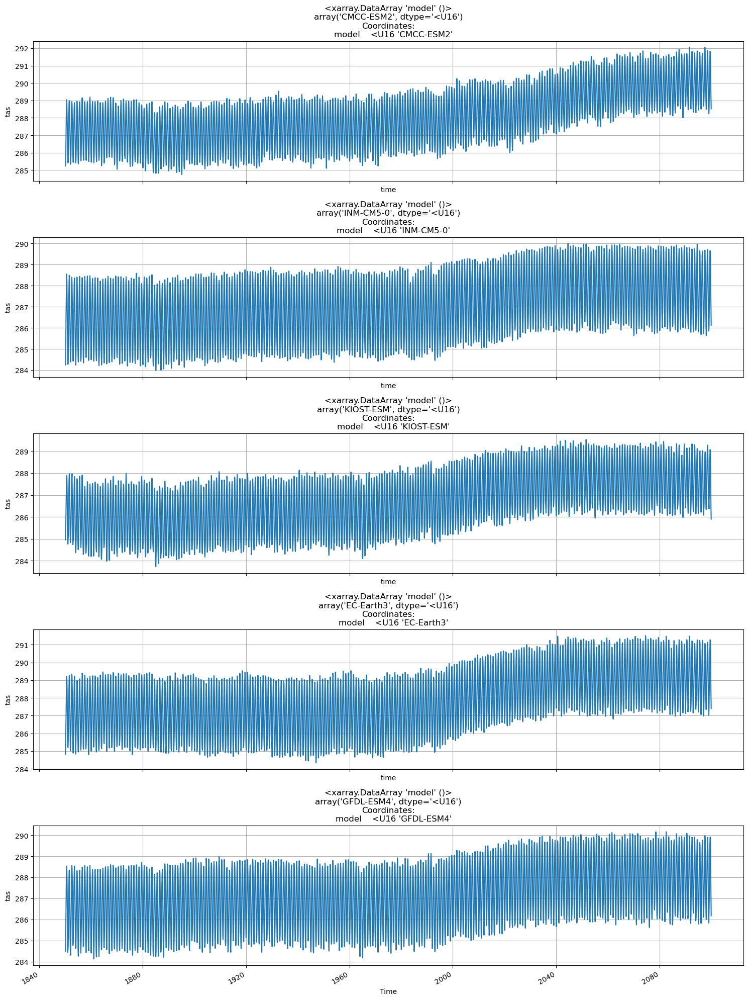

In [45]:
plot_time_series(0,5,35,ds_all_40)

### Monthly Anomalies

In [51]:
#remove seasonal cycle
ds_all_models_anom = ds_all_39.tas.groupby('time.month') - ds_all_39.tas.groupby('time.month').mean('time')
#remove baseline: remove avg temp from 1850 to 1900
#ensure that what we are plotting are monthly anomalies relative to an 1850-1900 baseline
ds_all_models_anom = ds_all_models_anom - ds_all_models_anom.sel(time=slice('1850','1900')).mean('time')
ds_all_models_anom

C:\Users\panda\miniconda3\envs\temp_var\Lib\site-packages\xarray\core\indexing.py:1443: PerformanceWarning: Slicing with an out-of-order index is generating 250 times more chunks
  return self.array[key]


<xarray.DataArray 'tas' (model: 39, time: 3000)>
dask.array<sub, shape=(39, 3000), dtype=float64, chunksize=(1, 1), chunktype=numpy.ndarray>
Coordinates:
  * time     (time) datetime64[ns] 1850-01-31 1850-02-28 ... 2099-12-31
  * model    (model) <U16 'UKESM1-0-LL' 'GISS-E2-1-H' ... 'INM-CM4-8'
    month    (time) int64 1 2 3 4 5 6 7 8 9 10 11 ... 2 3 4 5 6 7 8 9 10 11 12

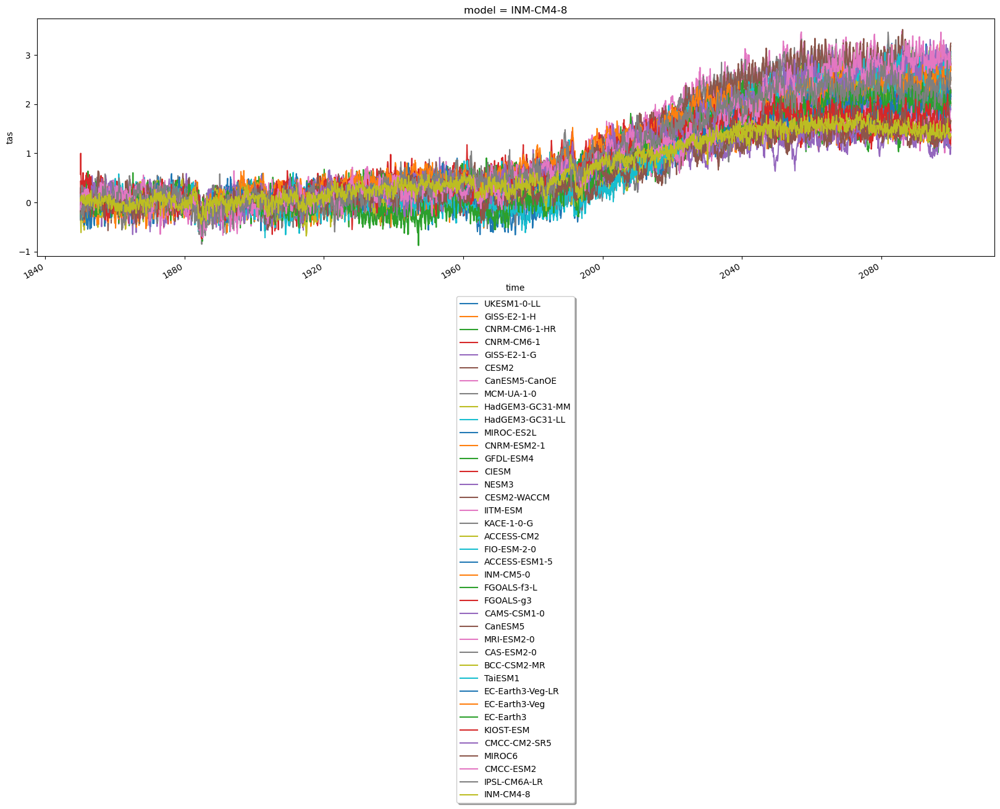

In [53]:
#redo figure with the model legend name on the bottom
fig, ax = plt.subplots(figsize=(20,5))
# Plot each line separately and collect the lines and labels
handles = []
labels = []
for m in ds_all_models_anom.model.values:
    line = ds_all_models_anom.sel(model=m).plot.line(ax=ax, x='time', hue='model', add_legend=False)
    handles.append(Line2D([], [], color=line[0].get_color(), label=m))  # Create Line2D handle
    labels.append(m)
ax.legend(handles=handles, labels=labels, loc='upper center', bbox_to_anchor=(0.5, -0.15), fancybox=True, shadow=True)

In [54]:
#saving to netcdf file
ds_all_39.to_netcdf("processed_tas_global_ssp126_data.nc", mode = 'w', format = "NETCDF4", engine = 'netcdf4')